# Description
* Inputs are mtx files from cellranger count
* The output will be used to compared with Seurat package and read_loom of Scanpy package

# Workflow begin
This tutorial comes from [Scanpy](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html#Preprocessing)

## Calling packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

## Set up environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi = 80, facecolor = 'white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


## Get dataset

In [3]:
%%time
Raw_adata_10x = sc.read_10x_mtx("/home/nguyen/Estrus_cellranger_count/Estrus_Raw/")

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
CPU times: user 52.5 s, sys: 355 ms, total: 52.9 s
Wall time: 56.9 s


In [4]:
Raw_adata_10x.var_names_make_unique()

In [5]:
Raw_adata_10x

AnnData object with n_obs × n_vars = 6599 × 31253
    var: 'gene_ids', 'feature_types'

* Input has:
     + 31253 genes
     + 6599 cells

# Preprocessing

normalizing counts per cell
    finished (0:00:00)


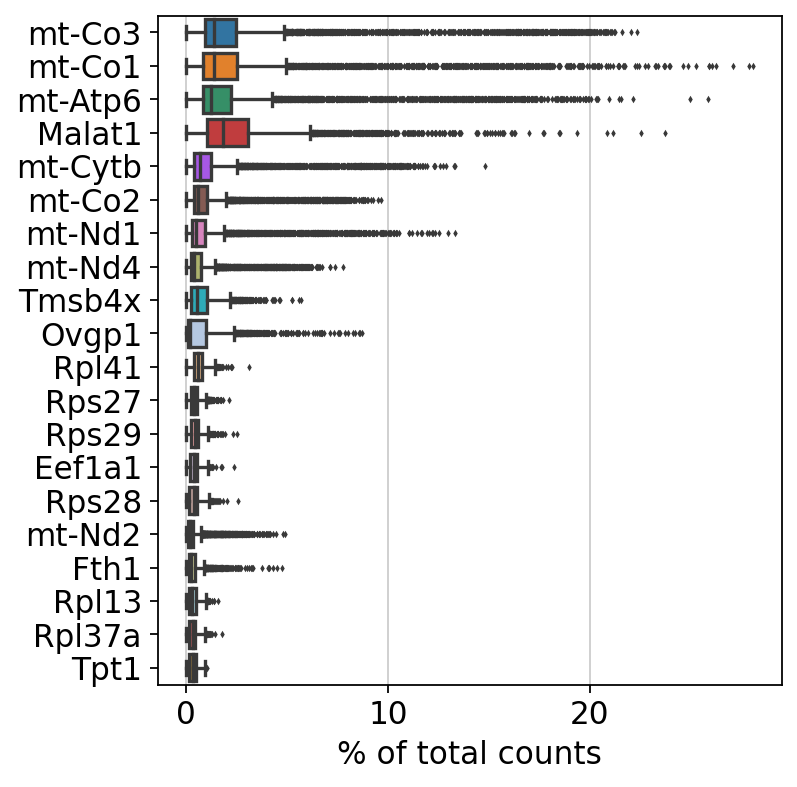

In [6]:
#Show 20 highest expressed genes
sc.pl.highest_expr_genes(Raw_adata_10x, n_top=20) 

## Basic filtering:
* Filter out genes that are detected in less than 3 cells 
* Filter out cells that have less than 200 genes expressed

In [7]:
%%time
sc.pp.filter_cells(Raw_adata_10x,min_genes=200)
sc.pp.filter_genes(Raw_adata_10x, min_cells=3)

filtered out 118 cells that have less than 200 genes expressed
filtered out 11833 genes that are detected in less than 3 cells
CPU times: user 239 ms, sys: 102 ms, total: 340 ms
Wall time: 372 ms


In [8]:
Raw_adata_10x

AnnData object with n_obs × n_vars = 6481 × 19420
    obs: 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

* Output:
     + 19420 genes 
     + 6481 cells

## Calculate percentage of mitochondrial genes

* High proportions are indicative of poor-quality cells, possibly because of loss of cytoplasmic RNA from perforated cells. 
* The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.
* With pp.calculate_qc_metrics, we can compute many metrics very efficiently.

In [9]:
# Add "mt" column to object
Raw_adata_10x.var['mt'] = Raw_adata_10x.var_names.str.startswith('mt-')

In [10]:
# This is the list of genes that start with mt
print(Raw_adata_10x.var['mt'][Raw_adata_10x.var['mt'] == True])

mt-Nd1     True
mt-Nd2     True
mt-Co1     True
mt-Co2     True
mt-Atp8    True
mt-Atp6    True
mt-Co3     True
mt-Nd3     True
mt-Nd4l    True
mt-Nd4     True
mt-Nd5     True
mt-Nd6     True
mt-Cytb    True
Name: mt, dtype: bool


* Note: mt-Nd6 and mt-Cytb are present in this list as compared to read_loom

In [11]:
# Calculate percentage of mito genes
sc.pp.calculate_qc_metrics(Raw_adata_10x, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

* Note: percentage of mito genes will be calculated and stored in pct_counts_mt row for each cell

In [12]:
# This is the data in "pct_counts_mt" row
Raw_adata_10x.obs.pct_counts_mt.head()

AAACCTGAGGGTATCG-1     8.850338
AAACCTGCAAACTGCT-1    11.810639
AAACCTGCAATCCAAC-1     5.032095
AAACCTGCAGATCGGA-1     9.849472
AAACCTGCATTGTGCA-1     5.396392
Name: pct_counts_mt, dtype: float32

... storing 'feature_types' as categorical
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


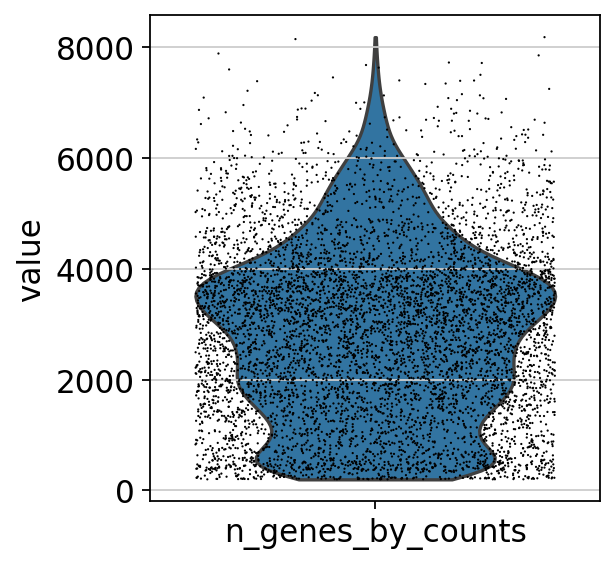

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


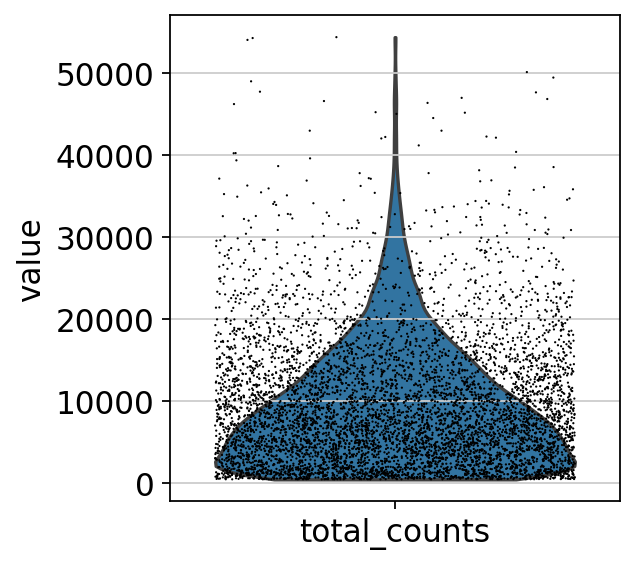

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


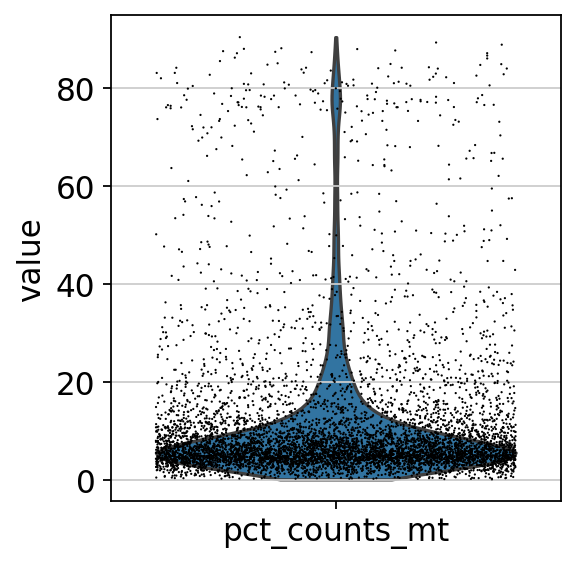

In [13]:
sc.pl.violin(Raw_adata_10x,'n_genes_by_counts',jitter=0.4) 
sc.pl.violin(Raw_adata_10x,'total_counts',jitter=0.4)
sc.pl.violin(Raw_adata_10x,'pct_counts_mt',jitter=0.4)

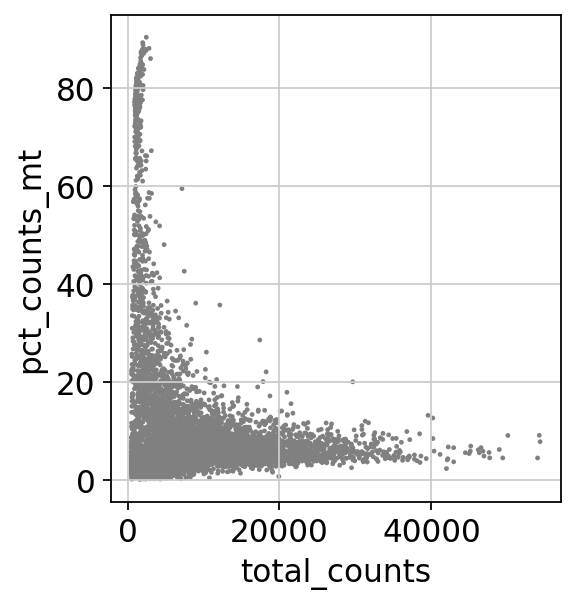

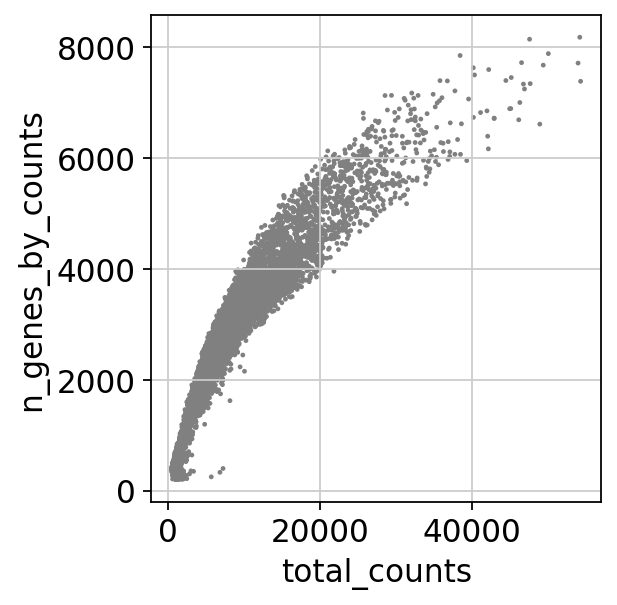

In [14]:
sc.pl.scatter(Raw_adata_10x, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(Raw_adata_10x, x='total_counts', y='n_genes_by_counts')

## Filter out low-quality cells
* We filter out cells that have unique feature counts over 6000
* Because any cell that has more than 6000 genes are likely doublets
* Note: Seurat tutorial used 2500 instead of 6000
* We also filter out cells that have more than 5% mitochondrial genes
* Because those are likely to be dead cells

In [15]:
%%time
# This is also known as slicing
Raw_adata_10x = Raw_adata_10x[Raw_adata_10x.obs.n_genes<6000,:]

CPU times: user 2.36 ms, sys: 0 ns, total: 2.36 ms
Wall time: 2.42 ms


In [16]:
Raw_adata_10x

View of AnnData object with n_obs × n_vars = 6321 × 19420
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [17]:
%%time
Raw_adata_10x = Raw_adata_10x[Raw_adata_10x.obs.pct_counts_mt<5,:]

CPU times: user 1.87 ms, sys: 0 ns, total: 1.87 ms
Wall time: 1.7 ms


In [18]:
Raw_adata_10x

View of AnnData object with n_obs × n_vars = 2174 × 19420
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

* After filtering step, the dataset is left with:
     + 19420 genes 
     + 2174 cells

## Normalizing the data
* Perform normalization method
* This is then natural-log transformed using log1p
* Normalization ensures that the gene expression in each cell doesn't overpower the expression of lesser expressed genes. 

In [19]:
%%time
#If target_sum = None then the medium of UMI_counts/reads per cell is assigned to all cells to have counts comparable among all cells
sc.pp.normalize_total(Raw_adata_10x, target_sum=None)
#Logarithmize the data matrix. Makes it easier to visualize data.
sc.pp.log1p(Raw_adata_10x)

normalizing counts per cell
    finished (0:00:00)
CPU times: user 139 ms, sys: 7.77 ms, total: 147 ms
Wall time: 168 ms


/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


## Identification of highly variable features (feature selection)

In [20]:
%%time
sc.pp.highly_variable_genes(Raw_adata_10x, n_top_genes=5000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 371 ms, sys: 3.74 ms, total: 374 ms
Wall time: 444 ms


## Plotting highly variable features

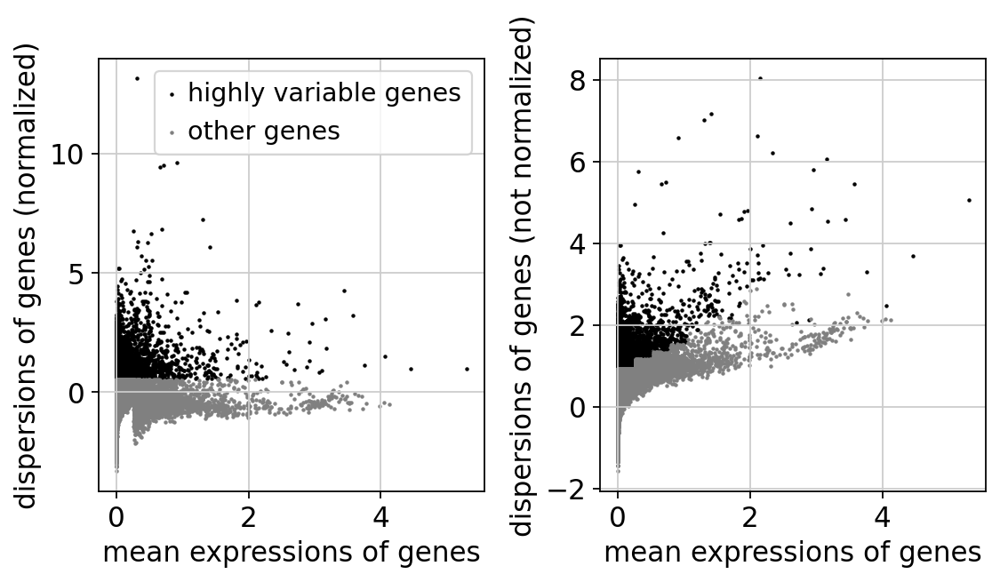

In [21]:
sc.pl.highly_variable_genes(Raw_adata_10x)

## Regress out data and perform scaling
* Regressing out total counts per cell and pct_counts_mt before scaling. 
* Take out mitochondrial genes before scaling (analyzing) the data 
* Because mito_genes shouldn't be accounted for cell population analysis.

In [22]:
%%time
# Scaling = takes all your genes and makes sure that they do not overpower other genes in all cells. 
# 'max_volume' is set to 10 to follow Seurats vignette
sc.pp.regress_out(Raw_adata_10x,['total_counts', 'pct_counts_mt'])
sc.pp.scale(Raw_adata_10x, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:46)
CPU times: user 44.3 s, sys: 151 ms, total: 44.4 s
Wall time: 47 s


## Perform linear dimensional reduction (PCA)

In [23]:
%%time
# arpack is default
# Reduce the dimensionality of the data by running principal component analysis (PCA), 
# which reveals the main axes of variation and denoises the data.
sc.tl.pca(Raw_adata_10x, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
CPU times: user 9.92 s, sys: 5.8 s, total: 15.7 s
Wall time: 740 ms


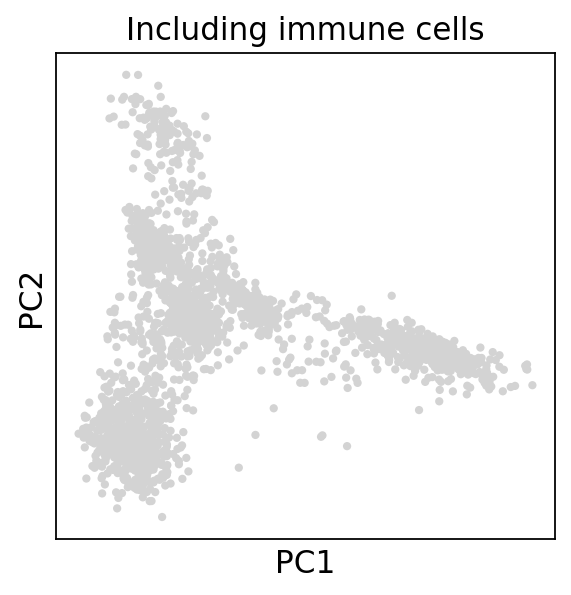

In [24]:
sc.pl.pca(Raw_adata_10x, title="Including immune cells",save = "Including_immune_cells.pdf")

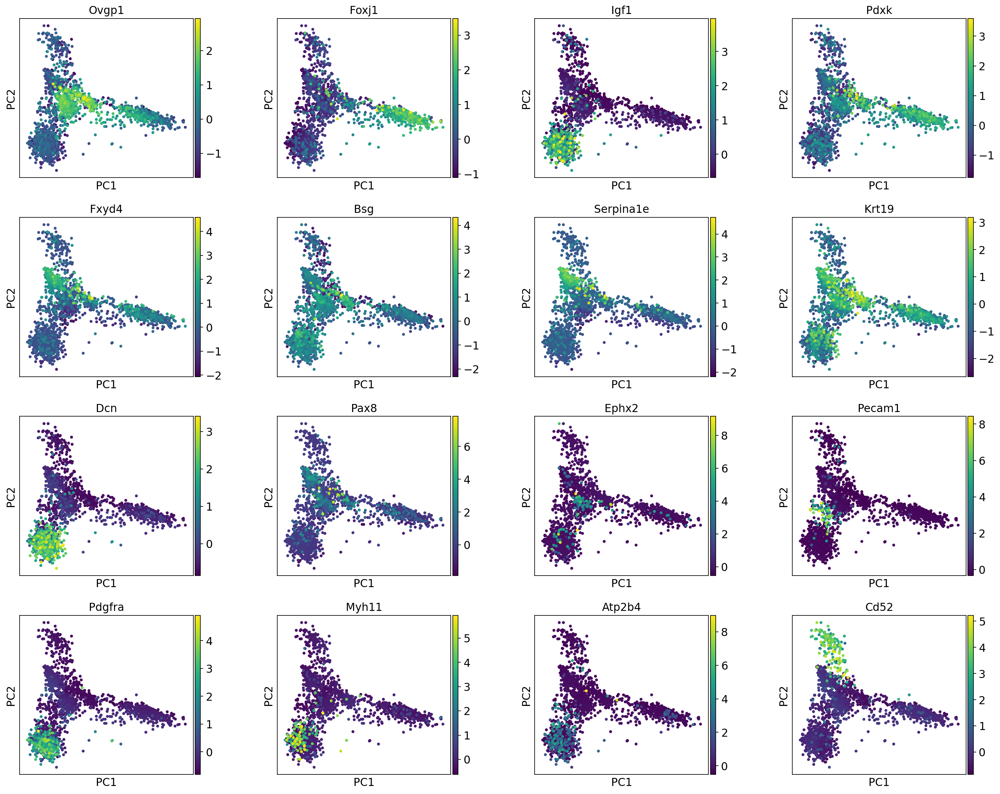

In [25]:
sc.pl.pca(Raw_adata_10x, wspace=0.35,
          color=['Ovgp1', 
              'Foxj1', 'Igf1', 'Pdxk', 
                  'Fxyd4', 'Bsg', 
              'Serpina1e', 'Krt19', 
              'Dcn', 'Pax8',
                  'Ephx2', 
              'Pecam1', 'Pdgfra', 'Myh11', 'Atp2b4', 
              'Cd52'], save = "Including_immune_cells1.pdf")

## Determine the ‘dimensionality’ of the data
* An elbow plot often corresponds well enough with the significant dims and is much faster to run 
* According to the graph below, choose the first 22 principle components to use

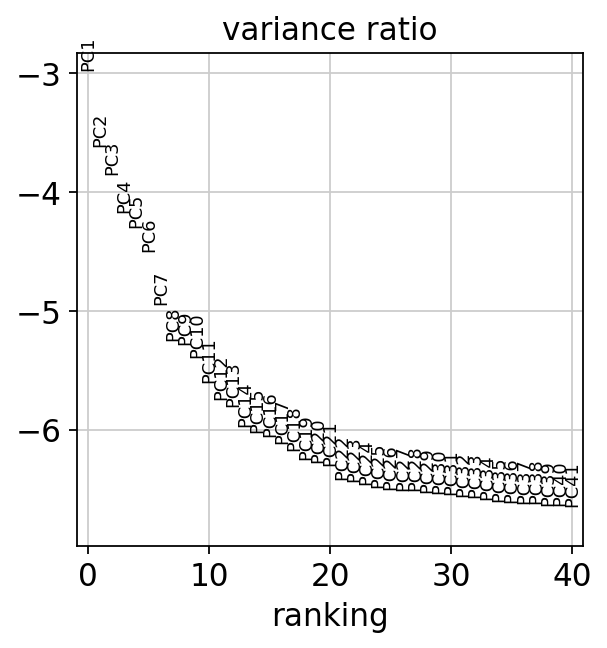

In [26]:
sc.pl.pca_variance_ratio(Raw_adata_10x,n_pcs=40,log=True)

## Computing the neighborhood graph

In [27]:
%%time
#Set n_pcs according to the elbow plot
sc.pp.neighbors(Raw_adata_10x,n_neighbors=10,n_pcs=22) 

computing neighbors
    using 'X_pca' with n_pcs = 22
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
CPU times: user 2.59 s, sys: 1.34 s, total: 3.93 s
Wall time: 1.47 s


## Embedding the neighborhood graph

In [28]:
%%time
sc.tl.umap(Raw_adata_10x)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
CPU times: user 2.62 s, sys: 2.08 s, total: 4.69 s
Wall time: 1.82 s


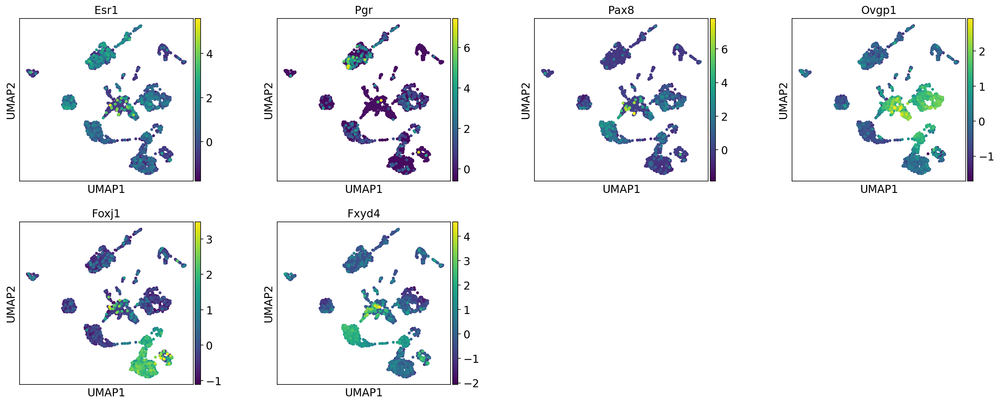

In [29]:
sc.pl.umap(Raw_adata_10x, wspace=0.35,
           color=['Esr1', 'Pgr', 'Pax8', 'Ovgp1', 'Foxj1', 'Fxyd4'])

## Find cell clusters using Leiden's method

In [30]:
%%time
sc.tl.leiden(Raw_adata_10x, resolution=0.17)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 47.2 ms, sys: 397 µs, total: 47.6 ms
Wall time: 47.1 ms


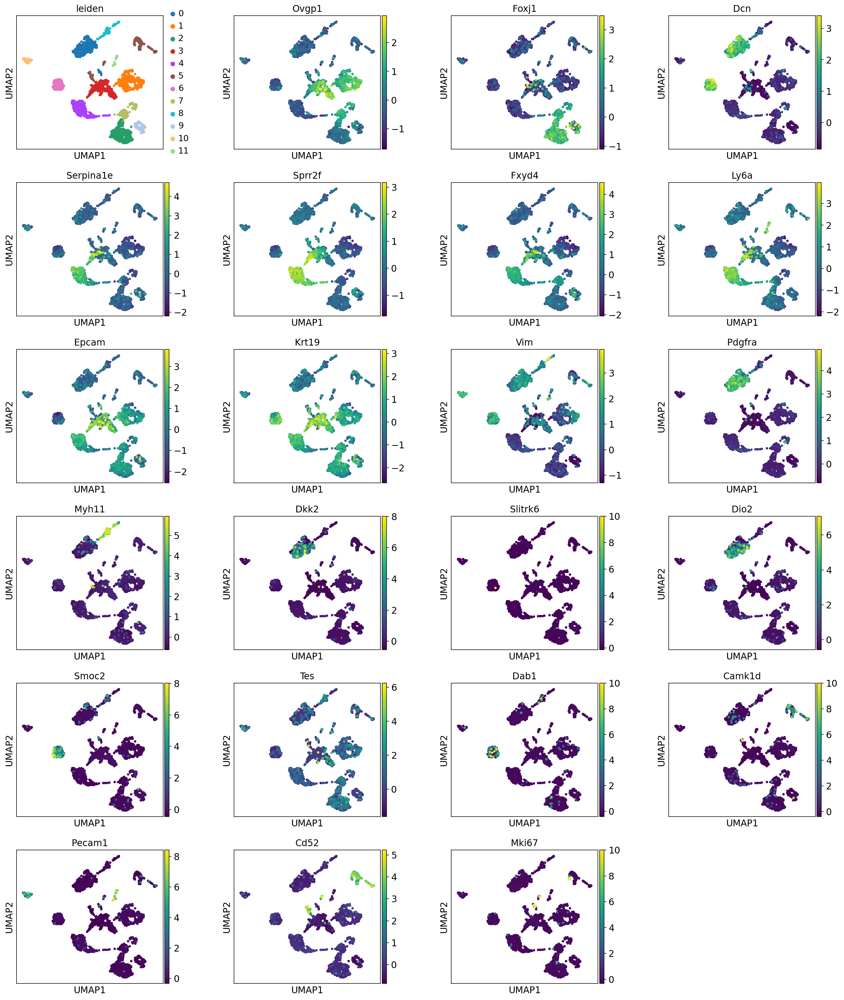

In [31]:
sc.pl.umap(Raw_adata_10x, wspace=0.35,
           color=['leiden', 'Ovgp1', 'Foxj1', 'Dcn', 'Serpina1e', 'Sprr2f',
                  'Fxyd4', 'Ly6a', 'Epcam', 'Krt19', 'Vim', 'Pdgfra', 'Myh11', 
                  'Dkk2', 'Slitrk6', 'Dio2', 'Smoc2', 'Tes', 'Dab1', 'Camk1d', 'Pecam1', 'Cd52','Mki67'], save = "Including_immune_cells.pdf")

## Removing immune cells

In [32]:
Estrus_subset = Raw_adata_10x[Raw_adata_10x.obs['leiden'].isin(
    ['0', '1', '2', '3','4', '6','7','8','9'])]

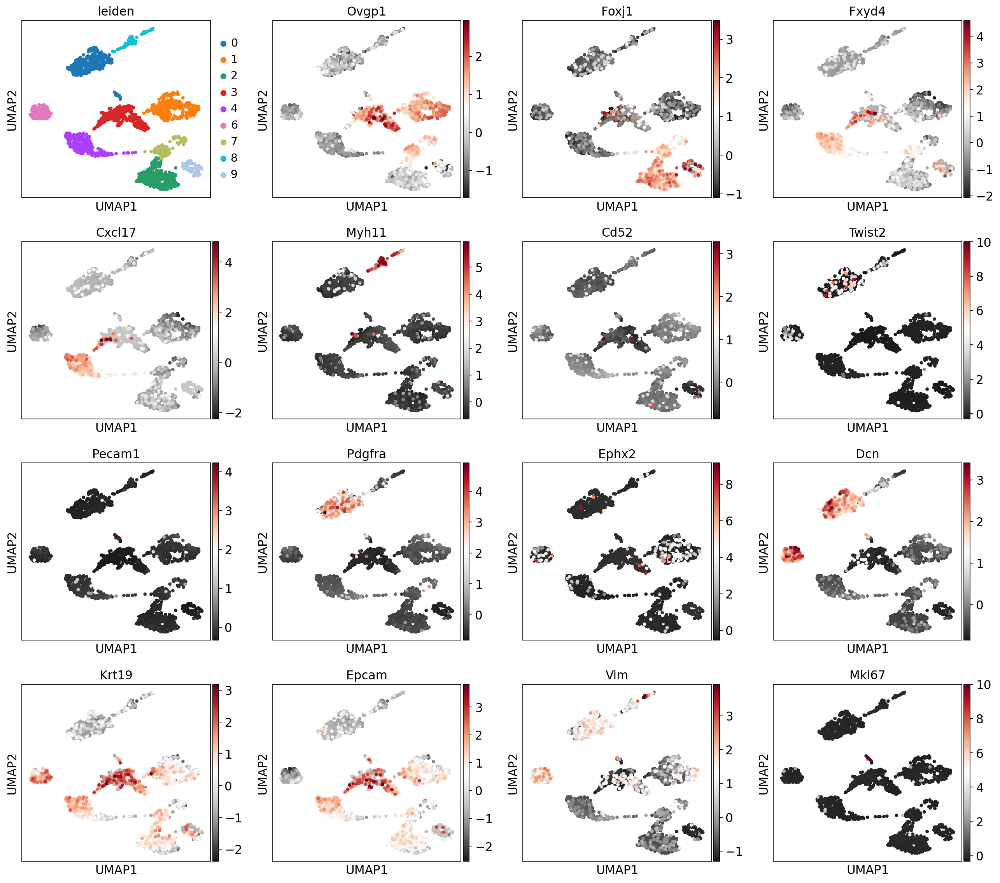

In [33]:
sc.pl.umap(Estrus_subset, 
           color_map='RdGy_r',
           color=['leiden', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Cxcl17', 'Myh11', 'Cd52', 'Twist2', 'Pecam1',
                 'Pdgfra', 'Ephx2', 'Dcn', 'Krt19', 'Epcam', 'Vim','Mki67'], save = "Immune_cells_removed.pdf")

In [34]:
Estrus_subset

View of AnnData object with n_obs × n_vars = 1927 × 19420
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

* After removing immune cells, the dataset is left with:
    + 19420 genes
    + 1927 cells

## Re-run analysis after excluding immune cells

* Below, you will have to rerun the pipeline with Estrus_subset (after removal of Cd52, and Pecam1 cells). 
* This is because PCA, neighbors, and umap are dependent on all current cells and because I removed unwanted cells I have to re-run those commands.

In [35]:
%%time
sc.tl.pca(Estrus_subset, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
CPU times: user 5.06 s, sys: 3.29 s, total: 8.35 s
Wall time: 487 ms


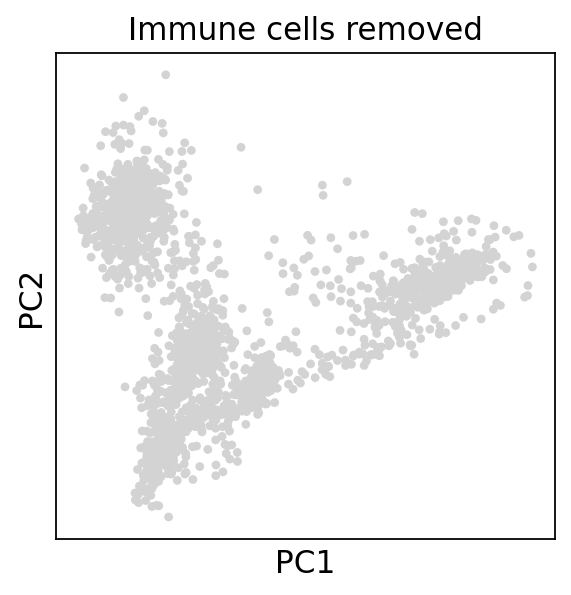

In [36]:
sc.pl.pca(Estrus_subset, title="Immune cells removed", save = "Immune_cells_removed.pdf")

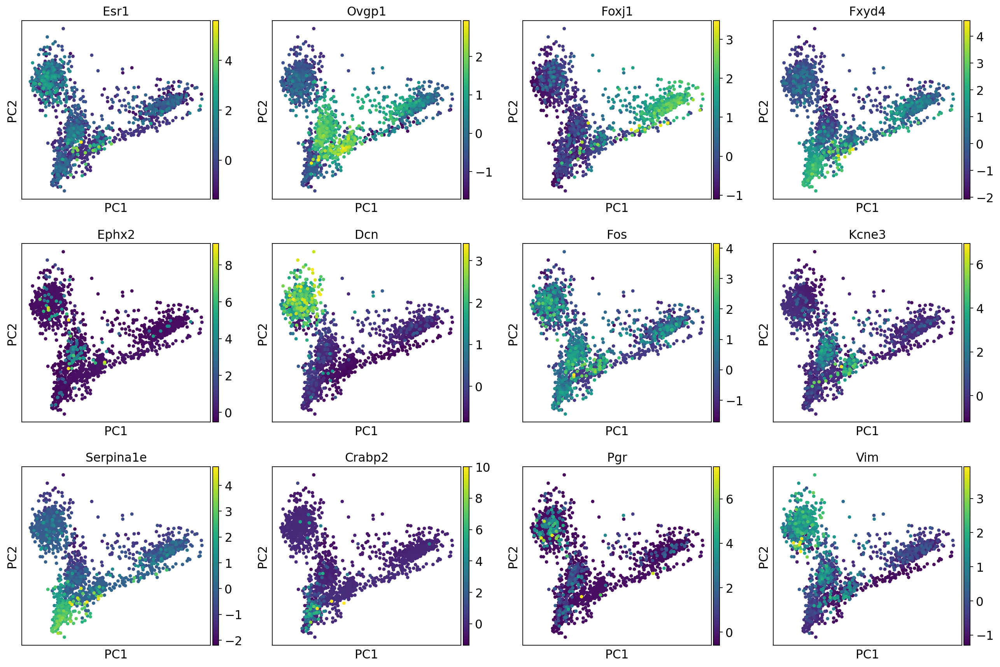

In [37]:
sc.pl.pca(Estrus_subset,
          color=['Esr1', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Ephx2', 'Dcn', 'Fos', 'Kcne3', 'Serpina1e', 'Crabp2', 'Pgr', 'Vim'], save = "Immune_cells_removed1.pdf")

In [38]:
%%time
sc.pp.neighbors(Estrus_subset, n_neighbors=10, n_pcs=22)

computing neighbors
    using 'X_pca' with n_pcs = 22
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
CPU times: user 1.08 s, sys: 1.61 s, total: 2.69 s
Wall time: 146 ms


In [39]:
%%time
sc.tl.umap(Estrus_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
CPU times: user 2.92 s, sys: 1.67 s, total: 4.59 s
Wall time: 2.54 s


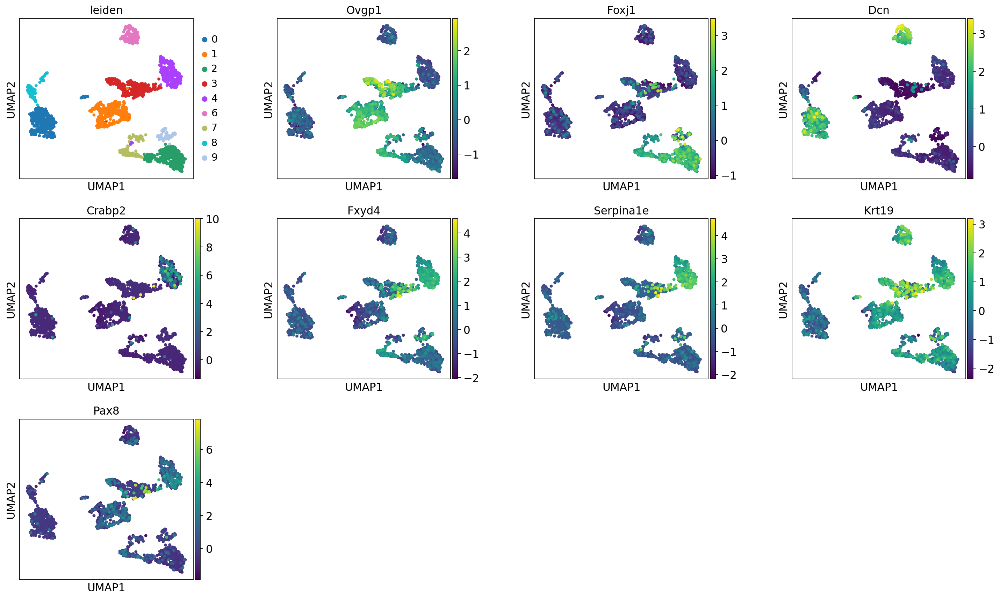

In [40]:
sc.pl.umap(Estrus_subset, wspace=0.35,
           color=['leiden', 'Ovgp1', 'Foxj1', 'Dcn', 'Crabp2', 'Fxyd4', 'Serpina1e', 'Krt19', 'Pax8'])

In [41]:
%%time
sc.tl.leiden(Estrus_subset, resolution=0.075)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 48.1 ms, sys: 104 µs, total: 48.3 ms
Wall time: 47.8 ms


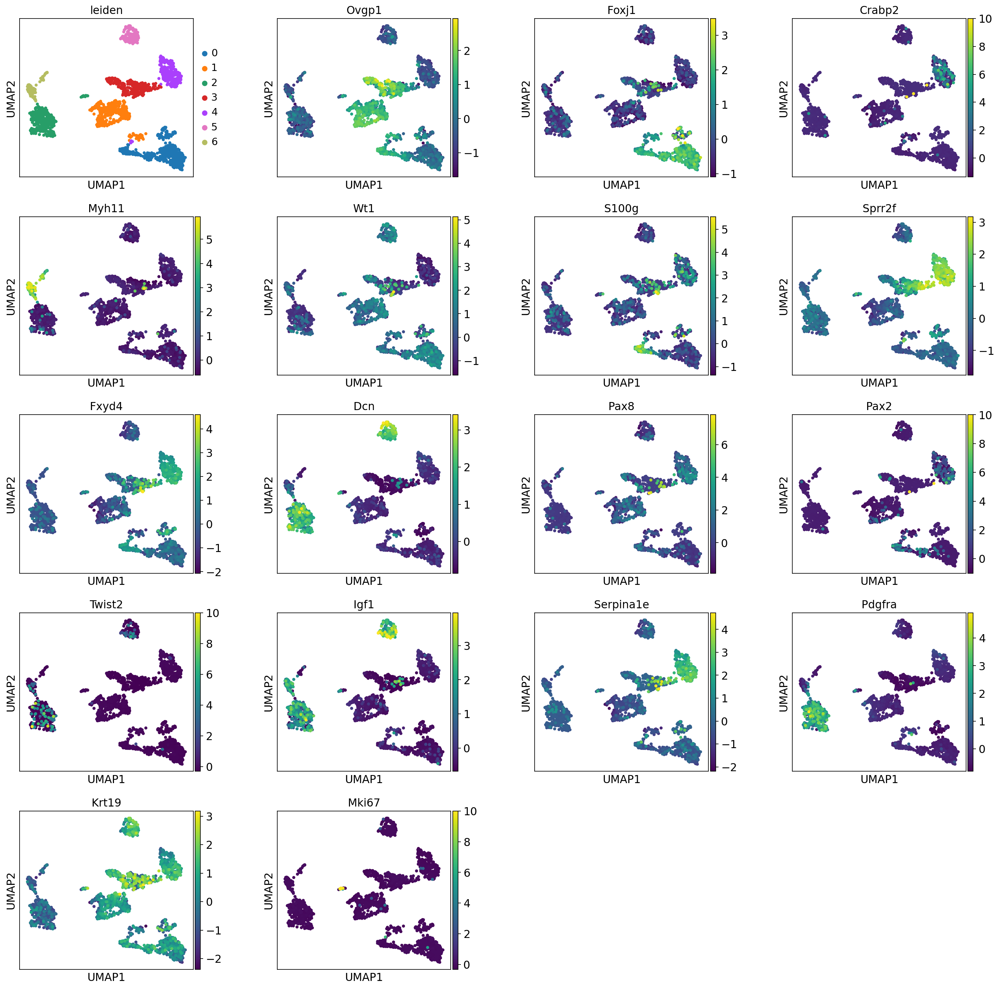

In [42]:
sc.pl.umap(Estrus_subset, wspace=0.35, 
           color=['leiden', 'Ovgp1', 'Foxj1', 'Crabp2', 'Myh11', 'Wt1', 'S100g', 'Sprr2f',
                  'Fxyd4', 'Dcn', 'Pax8', 'Pax2', 'Twist2', 'Igf1', 'Serpina1e', 'Pdgfra', 'Krt19', 'Mki67'], save = "No_immune_cells_recluster.pdf")

In [43]:
marker_genes = ['Epcam', 'Krt15','Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f', 'Fxyd4', 'Igfbp6',
                'Acta2', 'Myh11','Foxj1','Ovgp1','Wt1','Serpina1e','S100g','Pecam1'
                 ]

In [ ]:
sc.pl.umap(Estrus_subset, color=marker_genes, save = "No_immune_cells_recluster1.pdf")

## Rename clusters

In [ ]:
new_cluster_names = [
    '1 Ciliated_InfAmp',
    '2 Secretory_InfAmp',
    '3 Fibroblast Pdgfra+',
    '4 Epithelial_subset',
    '5 Secretory_IsthUTJ',
    '6 Fibroblast Pdgfra-',
    '7 Muscle']
Estrus_subset.rename_categories('leiden', new_cluster_names)

In [ ]:
sc.pl.umap(Estrus_subset, color='leiden', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save = "Clusters_names.pdf")

In [ ]:
Estrus_subset.obs.groupby(["leiden"]).apply(len)

In [ ]:
ax = sc.pl.dotplot(Estrus_subset, 
                   marker_genes, groupby='leiden', dendrogram=True, 
                   color_map='Blues',save = "Marker_genes.pdf")

## Extract top genes for each clusters

In [ ]:
%%time
sc.tl.rank_genes_groups(Estrus_subset, 'leiden', method='wilcoxon',n_genes=500)
sc.pl.rank_genes_groups(Estrus_subset, n_genes=25, sharey=False)

In [ ]:
result = Estrus_subset.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(20)

In [ ]:
sc.pl.rank_genes_groups_heatmap(Estrus_subset, n_genes=10,
                                standard_scale='var',
                                groupby='leiden',
                                show_gene_labels=True, save = "Top10_genes.pdf")

In [ ]:
Estrus_subset.write('./Estrus_subset_analyzed.h5ad')